# How to Train Detectron2 on Custom Objects

This tutorial implements the new [Detectron2 Library](https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/) by facebook. This notebook shows training on **your own custom objects** for object detection.

It is worth noting that the Detectron2 library goes far beyond object detection, supporting semantic segmentation, keypoint detection, mask, and densepose.


### Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on [how to train Detectron2](https://blog.roboflow.ai/how-to-train-detectron2/), concurrently.

### Steps Covered in this Tutorial

In this tutorial, we will walk through the steps required to train Detectron2 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install Detectron2 dependencies
* Download custom Detectron2 object detection data
* Visualize Detectron2 training data
* Write our Detectron2 Training configuration
* Run Detectron2 training
* Evaluate Detectron2 performance
* Run Detectron2 inference on test images



### **About**

[Roboflow](https://roboflow.ai) enables teams to deploy custom computer vision models quickly and accurately. Convert data from to annotation format, assess dataset health, preprocess, augment, and more. It's free for your first 1000 source images.

#### ![Roboflow Workmark](https://i.imgur.com/WHFqYSJ.png)

# Install Detectron2 Dependencies

In [1]:
# Install dependencies
!pip install -U torch torchvision -f https://download.pytorch.org/whl/cu101/torch_stable.html
!pip install cython pyyaml
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.2/865.2 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 393.1/393.1 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 120.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 92.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 48.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 571.0/571.0 MB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.2/200.2 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 65.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.2/158.2 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.6/216.6 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.8/1

In [2]:
!pip install -q torch torchvision --index-url https://download.pytorch.org/whl/cu118
!pip install -q 'git+https://github.com/facebookresearch/detectron2.git'

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.3/81.3 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 458.7/458.7 kB 25.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 55.2 MB/s eta 0:00:00


In [3]:
# Install detectron2 (specific version)
!pip install 'git+https://github.com/facebookresearch/detectron2.git@v0.6'

  Cloning https://github.com/facebookresearch/detectron2.git (to revision v0.6) to /tmp/pip-req-build-rdt67egg
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-rdt67egg
  Running command git checkout -q d1e04565d3bec8719335b88be9e9b961bf3ec464
  Resolved https://github.com/facebookresearch/detectron2.git to commit d1e04565d3bec8719335b88be9e9b961bf3ec464
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.0/131.0 kB 7.6 MB/s eta 0:00:00
  Attempting uninstall: black
    Found existing installation: black 25.1.0
    Uninstalling black-25.1.0:
      Successfully uninstalled black-25.1.0


In [4]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Import and Register Custom Detectron2 Data

In [5]:
!curl -L "https://universe.roboflow.com/ds/0T7BF7LxIM?key=BnFN3QYRkV" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
#!curl -L "https://app.roboflow.com/ds/jHJKFKW3v0?key=xrUsfIwlGP" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0   3309      0 --:--:-- --:--:-- --:--:--  3300
100 7285k  100 7285k    0     0  3369k      0  0:00:02  0:00:02 --:--:-- 7701k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/114_jpg.rf.ec0e2ec23ca48cb2aee25914b5c1ea19.jpg  
 extracting: test/22_jpg.rf.cf1edde2eb5db9c4323da7cbb94cafed.jpg  
 extracting: test/23_jpg.rf.d33d7190ae4b2355189eefe22bf92aa9.jpg  
 extracting: test/34_jpg.rf.df2309d765dab9898887fea88e168e65.jpg  
 extracting: test/36_jpg.rf.f9d7a547bd9d5a86959fe68550b07b81.jpg  
 extracting: test/43_jpg.rf.a6f4e73420cee5ba89eeb4faa7dad47e.jpg  
 extracting: test/4_jpg.rf.de3434f7bc5d9fdef8f84fae713f73ef.jpg  
 extracting: test/53_jpg.rf.b1b377173662ee43d598101090e09056.jpg  
 extracting: test/56_jpg.rf.38

In [6]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [05/08 14:08:54 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/08 14:08:54 d2.data.datasets.coco]: Loaded 260 images in COCO format from /content/train/_annotations.coco.json


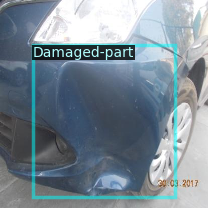

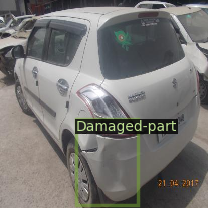

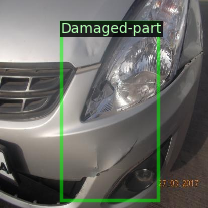

In [7]:

# Visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [8]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [9]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [10]:
from detectron2.data import DatasetCatalog

dataset_dicts = DatasetCatalog.get("my_dataset_train")

label_counts = {}

for data in dataset_dicts:
    for annotation in data["annotations"]:
        category_id = annotation["category_id"]
        if category_id in label_counts:
            label_counts[category_id] += 1
        else:
            label_counts[category_id] = 1

print("Label Distribution:")
for label, count in sorted(label_counts.items()):
    print(f"Label {label}: {count} instances")


WARNING [05/08 14:09:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/08 14:09:07 d2.data.datasets.coco]: Loaded 260 images in COCO format from /content/train/_annotations.coco.json
Label Distribution:
Label 1: 206 instances
Label 2: 58 instances


In [11]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1400)
cfg.SOLVER.GAMMA = 0.05

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500

cfg.OUTPUT_DIR = "./output_frcnn"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer1 = CocoTrainer(cfg)
trainer1.resume_or_load(resume=False)
trainer1.train()

[05/08 14:09:09 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:626: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
model_final_68b088.pkl: 421MB [00:02, 172MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[05/08 14:09:12 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:554: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4314.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/08 14:09:53 d2.utils.events]:  eta: 0:42:13  iter: 19  total_loss: 1.843  loss_cls: 1.128  loss_box_reg: 0.6442  loss_rpn_cls: 0.02212  loss_rpn_loc: 0.009844    time: 1.7610  last_time: 1.9096  data_time: 0.0469  last_data_time: 0.0165   lr: 1.931e-06  max_mem: 6899M
[05/08 14:10:33 d2.utils.events]:  eta: 0:42:43  iter: 39  total_loss: 1.808  loss_cls: 1.095  loss_box_reg: 0.6744  loss_rpn_cls: 0.03047  loss_rpn_loc: 0.009818    time: 1.7790  last_time: 1.7597  data_time: 0.0233  last_data_time: 0.0220   lr: 2.911e-06  max_mem: 6899M
[05/08 14:11:11 d2.utils.events]:  eta: 0:43:14  iter: 59  total_loss: 1.723  loss_cls: 1.028  loss_box_reg: 0.6487  loss_rpn_cls: 0.01568  loss_rpn_loc: 0.01087    time: 1.8229  last_time: 1.8392  data_time: 0.0293  last_data_time: 0.0102   lr: 3.891e-06  max_mem: 6899M
[05/08 14:11:50 d2.utils.events]:  eta: 0:43:57  iter: 79  total_loss: 1.605  loss_cls: 0.9526  loss_box_reg: 0.564  loss_rpn_cls: 0.03756  loss_rpn_loc: 0.0099    time: 1.8554  last

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:626: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[05/08 14:25:41 d2.evaluation.evaluator]: Inference done 11/74. Dataloading: 0.0013 s/iter. Inference: 0.1889 s/iter. Eval: 0.0004 s/iter. Total: 0.1906 s/iter. ETA=0:00:12
[05/08 14:25:46 d2.evaluation.evaluator]: Inference done 38/74. Dataloading: 0.0021 s/iter. Inference: 0.1887 s/iter. Eval: 0.0004 s/iter. Total: 0.1912 s/iter. ETA=0:00:06
[05/08 14:25:51 d2.evaluation.evaluator]: Inference done 64/74. Dataloading: 0.0028 s/iter. Inference: 0.1890 s/iter. Eval: 0.0004 s/iter. Total: 0.1923 s/iter. ETA=0:00:01
[05/08 14:25:53 d2.evaluation.evaluator]: Total inference time: 0:00:13.377625 (0.193879 s / iter per device, on 1 devices)
[05/08 14:25:53 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:13 (0.189053 s / iter per device, on 1 devices)
[05/08 14:25:53 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/08 14:25:53 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/08 14:25:53 d2.evaluation.coco_ev

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:626: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[05/08 14:42:28 d2.evaluation.evaluator]: Inference done 11/74. Dataloading: 0.0012 s/iter. Inference: 0.1890 s/iter. Eval: 0.0003 s/iter. Total: 0.1905 s/iter. ETA=0:00:12
[05/08 14:42:33 d2.evaluation.evaluator]: Inference done 37/74. Dataloading: 0.0037 s/iter. Inference: 0.1886 s/iter. Eval: 0.0004 s/iter. Total: 0.1928 s/iter. ETA=0:00:07
[05/08 14:42:38 d2.evaluation.evaluator]: Inference done 64/74. Dataloading: 0.0030 s/iter. Inference: 0.1887 s/iter. Eval: 0.0004 s/iter. Total: 0.1921 s/iter. ETA=0:00:01
[05/08 14:42:40 d2.evaluation.evaluator]: Total inference time: 0:00:13.361621 (0.193647 s / iter per device, on 1 devices)
[05/08 14:42:40 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:13 (0.188774 s / iter per device, on 1 devices)
[05/08 14:42:40 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/08 14:42:40 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/08 14:42:40 d2.evaluation.coco_ev

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:626: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[05/08 14:59:19 d2.evaluation.evaluator]: Inference done 11/74. Dataloading: 0.0059 s/iter. Inference: 0.1870 s/iter. Eval: 0.0004 s/iter. Total: 0.1933 s/iter. ETA=0:00:12
[05/08 14:59:24 d2.evaluation.evaluator]: Inference done 38/74. Dataloading: 0.0046 s/iter. Inference: 0.1869 s/iter. Eval: 0.0004 s/iter. Total: 0.1920 s/iter. ETA=0:00:06
[05/08 14:59:29 d2.evaluation.evaluator]: Inference done 65/74. Dataloading: 0.0034 s/iter. Inference: 0.1876 s/iter. Eval: 0.0003 s/iter. Total: 0.1915 s/iter. ETA=0:00:01
[05/08 14:59:31 d2.evaluation.evaluator]: Total inference time: 0:00:13.381797 (0.193939 s / iter per device, on 1 devices)
[05/08 14:59:31 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:12 (0.187981 s / iter per device, on 1 devices)
[05/08 14:59:31 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/08 14:59:31 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/08 14:59:31 d2.evaluation.coco_ev

In [12]:
import os
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Optional: If you're using COCO-style evaluation
# from detectron2.evaluation import COCOEvaluator

# Create config
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")

# Dataset registration (ensure these are already registered properly)
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

# Hyperparameters
cfg.DATALOADER.NUM_WORKERS = 4
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.STEPS = (1000, 1400)
cfg.SOLVER.GAMMA = 0.05
cfg.TEST.EVAL_PERIOD = 500

# Model settings
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.RETINANET.NUM_CLASSES = 2  # Only for RetinaNet
cfg.OUTPUT_DIR = "./output_retina"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Trainer
trainer2 = CocoTrainer(cfg)
trainer2.resume_or_load(resume=False)
trainer2.train()

[05/08 14:59:33 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:626: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
model_final_971ab9.pkl: 228MB [00:01, 193MB/s]                           
head.cls_score.{bias, weight}
  pixel_mean
  pixel_std


[05/08 14:59:35 d2.engine.train_loop]: Starting training from iteration 0
[05/08 14:59:55 d2.utils.events]:  eta: 0:25:10  iter: 19  total_loss: 1.895  loss_cls: 1.207  loss_box_reg: 0.725    time: 0.9998  last_time: 1.0293  data_time: 0.0378  last_data_time: 0.0224   lr: 1.931e-06  max_mem: 6901M
[05/08 15:00:14 d2.utils.events]:  eta: 0:24:27  iter: 39  total_loss: 1.829  loss_cls: 1.129  loss_box_reg: 0.7223    time: 0.9737  last_time: 0.9893  data_time: 0.0228  last_data_time: 0.0098   lr: 2.911e-06  max_mem: 6901M
[05/08 15:00:32 d2.utils.events]:  eta: 0:23:55  iter: 59  total_loss: 1.685  loss_cls: 1.105  loss_box_reg: 0.6179    time: 0.9564  last_time: 0.8305  data_time: 0.0225  last_data_time: 0.0284   lr: 3.891e-06  max_mem: 6901M
[05/08 15:00:51 d2.utils.events]:  eta: 0:23:30  iter: 79  total_loss: 1.822  loss_cls: 1.148  loss_box_reg: 0.7025    time: 0.9472  last_time: 0.8507  data_time: 0.0245  last_data_time: 0.0253   lr: 4.871e-06  max_mem: 6901M
[05/08 15:01:09 d2.util

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:626: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[05/08 15:07:24 d2.evaluation.evaluator]: Inference done 11/74. Dataloading: 0.0020 s/iter. Inference: 0.1054 s/iter. Eval: 0.0004 s/iter. Total: 0.1079 s/iter. ETA=0:00:06
[05/08 15:07:29 d2.evaluation.evaluator]: Inference done 57/74. Dataloading: 0.0053 s/iter. Inference: 0.1047 s/iter. Eval: 0.0005 s/iter. Total: 0.1106 s/iter. ETA=0:00:01
[05/08 15:07:31 d2.evaluation.evaluator]: Total inference time: 0:00:07.660357 (0.111020 s / iter per device, on 1 devices)
[05/08 15:07:31 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:07 (0.104399 s / iter per device, on 1 devices)
[05/08 15:07:31 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/08 15:07:31 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/08 15:07:31 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[05/08 15:07:31 d2.evaluation.

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:626: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[05/08 15:15:11 d2.evaluation.evaluator]: Inference done 11/74. Dataloading: 0.0012 s/iter. Inference: 0.1042 s/iter. Eval: 0.0004 s/iter. Total: 0.1058 s/iter. ETA=0:00:06
[05/08 15:15:16 d2.evaluation.evaluator]: Inference done 59/74. Dataloading: 0.0018 s/iter. Inference: 0.1035 s/iter. Eval: 0.0004 s/iter. Total: 0.1058 s/iter. ETA=0:00:01
[05/08 15:15:17 d2.evaluation.evaluator]: Total inference time: 0:00:07.495389 (0.108629 s / iter per device, on 1 devices)
[05/08 15:15:17 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:07 (0.103738 s / iter per device, on 1 devices)
[05/08 15:15:17 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/08 15:15:17 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/08 15:15:18 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[05/08 15:15:18 d2.evaluation.

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:626: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[05/08 15:23:11 d2.evaluation.evaluator]: Inference done 11/74. Dataloading: 0.0057 s/iter. Inference: 0.1050 s/iter. Eval: 0.0004 s/iter. Total: 0.1111 s/iter. ETA=0:00:07
[05/08 15:23:16 d2.evaluation.evaluator]: Inference done 59/74. Dataloading: 0.0026 s/iter. Inference: 0.1033 s/iter. Eval: 0.0003 s/iter. Total: 0.1064 s/iter. ETA=0:00:01
[05/08 15:23:18 d2.evaluation.evaluator]: Total inference time: 0:00:07.448670 (0.107952 s / iter per device, on 1 devices)
[05/08 15:23:18 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:07 (0.103162 s / iter per device, on 1 devices)
[05/08 15:23:18 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/08 15:23:18 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/08 15:23:18 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/08 15:23:18 d2.evaluation.

In [13]:
# Load Faster R-CNN predictor
cfg_frcnn = get_cfg()
cfg_frcnn.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg_frcnn.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
cfg_frcnn.MODEL.WEIGHTS = os.path.join("./output_frcnn", "model_final.pth")
cfg_frcnn.MODEL.ROI_HEADS.NUM_CLASSES = 2
predictor_frcnn = DefaultPredictor(cfg_frcnn)

# Load RetinaNet predictor
cfg_retina = get_cfg()
cfg_retina.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg_retina.MODEL.RETINANET.SCORE_THRESH_TEST = 0.7
cfg_retina.MODEL.WEIGHTS = os.path.join("./output_retina", "model_final.pth")
cfg_retina.MODEL.RETINANET.NUM_CLASSES = 2
predictor_retina = DefaultPredictor(cfg_retina)
#test data
test_metadata = MetadataCatalog.get("my_dataset_test")

[05/08 15:23:20 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output_frcnn/model_final.pth ...


[05/08 15:23:22 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output_retina/model_final.pth ...


WARNING [05/08 15:23:23 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/08 15:23:23 d2.data.datasets.coco]: Loaded 38 images in COCO format from /content/test/_annotations.coco.json


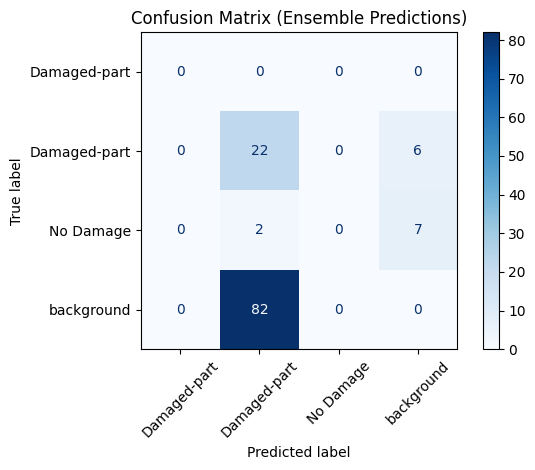

In [14]:
import os
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from detectron2.utils.visualizer import Visualizer
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.structures import Boxes

# Replace this with your actual ensemble prediction function
def ensemble_predictions(image):
    # Example: combine predictions from predictor1 and predictor2
    # You must define predictor1 and predictor2 earlier
    outputs1 = predictor_frcnn(image)
    outputs2 = predictor_retina(image)

    instances1 = outputs1["instances"].to("cpu")
    instances2 = outputs2["instances"].to("cpu")

    # Naive ensemble by concatenation (can improve with NMS, voting, etc.)
    from detectron2.structures import Instances
    from detectron2.structures import Boxes as Bx
    combined = Instances(image.shape[:2])
    combined.pred_boxes = Bx.cat([instances1.pred_boxes, instances2.pred_boxes])
    combined.scores = torch.cat([instances1.scores, instances2.scores])
    combined.pred_classes = torch.cat([instances1.pred_classes, instances2.pred_classes])

    return {"instances": combined}

# Load ground truth dataset only once
dataset_dicts = DatasetCatalog.get("my_dataset_test")
metadata = MetadataCatalog.get("my_dataset_test")
class_names = metadata.thing_classes

# Init label holders
true_labels = []
pred_labels = []
iou_threshold = 0.5

for image_path in glob.glob("/content/test/*.jpg"):
    im = cv2.imread(image_path)
    outputs = ensemble_predictions(im)

    if len(outputs["instances"]) == 0:
        continue  # Skip if no prediction made

    pred_instances = outputs["instances"].to("cpu")
    pred_boxes = pred_instances.pred_boxes.tensor.numpy()
    pred_classes = pred_instances.pred_classes.numpy()

    # Match ground truth image
    image_id = os.path.basename(image_path)
    gt_entry = next(d for d in dataset_dicts if d["file_name"].endswith(image_id))
    gt_boxes = np.array([anno["bbox"] for anno in gt_entry["annotations"]])
    gt_classes = np.array([anno["category_id"] for anno in gt_entry["annotations"]])

    # Convert GT boxes to [x1, y1, x2, y2]
    gt_boxes_xyxy = np.array([[x, y, x + w, y + h] for x, y, w, h in gt_boxes])
    matched_gt = set()

    for pb, pc in zip(pred_boxes, pred_classes):
        best_iou = 0
        best_gt_idx = -1
        for i, gb in enumerate(gt_boxes_xyxy):
            if i in matched_gt:
                continue
            xx1 = max(pb[0], gb[0])
            yy1 = max(pb[1], gb[1])
            xx2 = min(pb[2], gb[2])
            yy2 = min(pb[3], gb[3])
            inter_area = max(0, xx2 - xx1) * max(0, yy2 - yy1)
            pred_area = (pb[2] - pb[0]) * (pb[3] - pb[1])
            gt_area = (gb[2] - gb[0]) * (gb[3] - gb[1])
            union_area = pred_area + gt_area - inter_area
            iou = inter_area / union_area if union_area != 0 else 0

            if iou > best_iou:
                best_iou = iou
                best_gt_idx = i

        if best_iou >= iou_threshold:
            matched_gt.add(best_gt_idx)
            true_labels.append(gt_classes[best_gt_idx])
            pred_labels.append(pc)
        else:
            true_labels.append(-1)  # Unmatched GT
            pred_labels.append(pc)

    # Add missed ground truths (false negatives)
    for i in range(len(gt_classes)):
        if i not in matched_gt:
            true_labels.append(gt_classes[i])
            pred_labels.append(-1)

# Compute confusion matrix
all_labels = list(range(len(class_names))) + [-1]
disp_labels = class_names + ["background"]

cm = confusion_matrix(true_labels, pred_labels, labels=all_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=disp_labels)
disp.plot(cmap="Blues", xticks_rotation=45)
plt.title("Confusion Matrix (Ensemble Predictions)")
plt.tight_layout()
plt.show()


In [15]:
from detectron2.structures import Boxes, Instances
import torch

def ensemble_predictions(image):
    outputs1 = predictor_frcnn(image)["instances"].to("cpu")
    outputs2 = predictor_retina(image)["instances"].to("cpu")

    boxes = torch.cat([outputs1.pred_boxes.tensor, outputs2.pred_boxes.tensor], dim=0)
    scores = torch.cat([outputs1.scores, outputs2.scores], dim=0)
    classes = torch.cat([outputs1.pred_classes, outputs2.pred_classes], dim=0)

    # Create a combined Instances object
    ensemble_output = Instances(image.shape[:2])
    ensemble_output.pred_boxes = Boxes(boxes)
    ensemble_output.scores = scores
    ensemble_output.pred_classes = classes

    return ensemble_output

In [16]:
from detectron2.data import build_detection_test_loader
# Use cfg_loader just for building test loader
cfg_loader = get_cfg()
cfg_loader.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg_loader.DATASETS.TEST = ("my_dataset_test", )
cfg_loader.DATALOADER.NUM_WORKERS = 4

test_loader = build_detection_test_loader(cfg_loader, "my_dataset_test")
evaluator = COCOEvaluator("my_dataset_test", cfg_loader, False, output_dir="./output_retina")
evaluator.reset()

# Custom inference loop
from tqdm import tqdm
for idx, inputs in enumerate(tqdm(test_loader)):
    image = cv2.imread(inputs[0]["file_name"])
    instances = ensemble_predictions(image)  # <- must be Instances
    outputs = {"instances": instances}
    evaluator.process(inputs, [outputs])

# Final Evaluation
results = evaluator.evaluate()
print(results)

WARNING [05/08 15:23:35 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/08 15:23:35 d2.data.datasets.coco]: Loaded 38 images in COCO format from /content/test/_annotations.coco.json
[05/08 15:23:35 d2.data.build]: Distribution of instances among all 3 categories:
|   category   | #instances   |   category   | #instances   |  category  | #instances   |
|:------------:|:-------------|:------------:|:-------------|:----------:|:-------------|
| Damaged-part | 0            | Damaged-part | 29           | No Damage  | 10           |
|              |              |              |              |            |              |
|    total     | 39           |              |              |            |              |
[05/08 15:23:35 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/08 15:23:35 d2.data.common]: Seri

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:626: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
100%|██████████| 38/38 [00:13<00:00,  2.89it/s]

[05/08 15:23:48 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/08 15:23:48 d2.evaluation.coco_evaluation]: Saving results to ./output_retina/coco_instances_results.json
[05/08 15:23:48 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/08 15:23:48 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/08 15:23:48 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[05/08 15:23:48 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[05/08 15:23:48 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.078
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.249
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.010
 Average Precision  (AP) @[ IoU

In [17]:
from detectron2.data import build_detection_test_loader
# Use cfg_loader just for building test loader
cfg_loader = get_cfg()
cfg_loader.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg_loader.DATASETS.TEST = ("my_dataset_test", )
cfg_loader.DATALOADER.NUM_WORKERS = 4

test_loader = build_detection_test_loader(cfg_loader, "my_dataset_test")
evaluator = COCOEvaluator("my_dataset_test", cfg_loader, False, output_dir="./output_frcnn")
evaluator.reset()

# Custom inference loop
from tqdm import tqdm
for idx, inputs in enumerate(tqdm(test_loader)):
    image = cv2.imread(inputs[0]["file_name"])
    instances = ensemble_predictions(image)  # <- must be Instances
    outputs = {"instances": instances}
    evaluator.process(inputs, [outputs])

# Final Evaluation
results = evaluator.evaluate()
print(results)

WARNING [05/08 15:23:48 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/08 15:23:48 d2.data.datasets.coco]: Loaded 38 images in COCO format from /content/test/_annotations.coco.json
[05/08 15:23:48 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/08 15:23:48 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/08 15:23:48 d2.data.common]: Serializing 38 elements to byte tensors and concatenating them all ...
[05/08 15:23:48 d2.data.common]: Serialized dataset takes 0.01 MiB
WARNING [05/08 15:23:48 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:626: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
100%|██████████| 38/38 [00:13<00:00,  2.90it/s]

[05/08 15:24:02 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/08 15:24:02 d2.evaluation.coco_evaluation]: Saving results to ./output_frcnn/coco_instances_results.json
[05/08 15:24:02 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[05/08 15:24:02 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[05/08 15:24:02 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[05/08 15:24:02 d2.evaluation.fast_eval_api]: Accumulating evaluation results...


[05/08 15:24:02 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.02 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.078
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.249
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.010
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.081
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.105
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.155
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.155
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.000
 Average Recall     

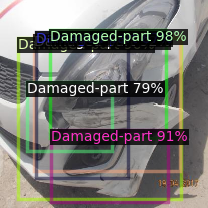

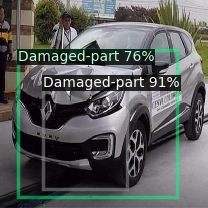

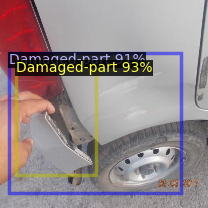

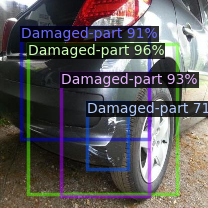

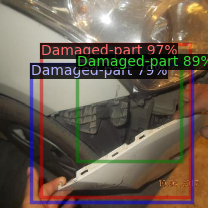

...

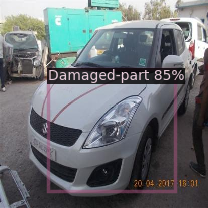

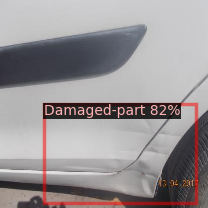

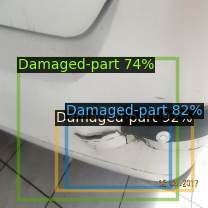

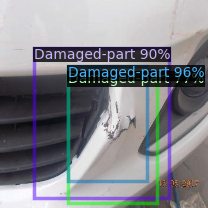

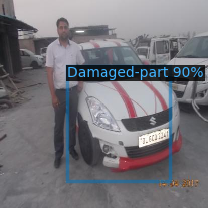

In [18]:
from detectron2.utils.visualizer import Visualizer
import cv2
import glob

for imageName in glob.glob('/content/test/*.jpg'):
    im = cv2.imread(imageName)
    ensemble_output = ensemble_predictions(im)

    v = Visualizer(im[:, :, ::-1], metadata=test_metadata, scale=0.5)
    out = v.draw_instance_predictions(ensemble_output)
    cv2_imshow(out.get_image()[:, :, ::-1])

# Inference with Detectron2 Saved Weights



In [19]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [20]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

[05/08 15:24:17 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output_retina/model_final.pth ...


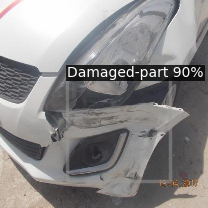

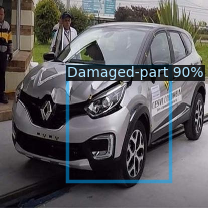

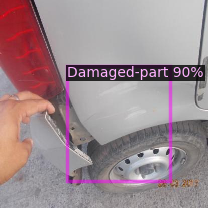

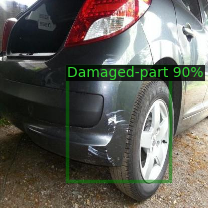

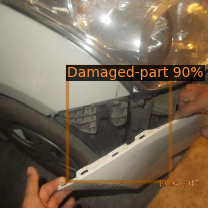

...

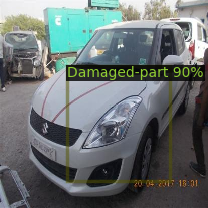

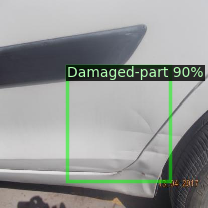

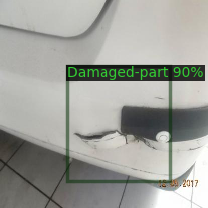

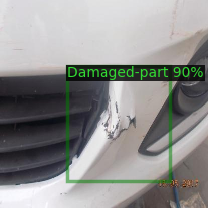

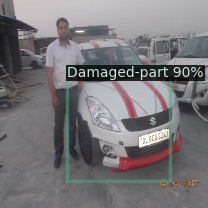

In [21]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = ensemble_predictions(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.5
                 )
  out = v.draw_instance_predictions(ensemble_output)
  cv2_imshow(out.get_image()[:, :, ::-1])

In [22]:
!unzip /content/noisy_test.zip

Archive:  /content/noisy_test.zip
  inflating: noisy_test/damaged_burn.jpg  
  inflating: noisy_test/damaged_dust.jpg  
  inflating: noisy_test/damaged_freezed.jpg  
  inflating: noisy_test/damaged_multiple.jpg  
  inflating: noisy_test/damaged_rainy.jpg  


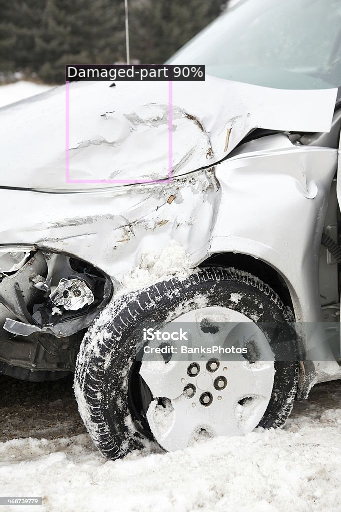

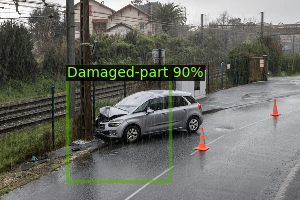

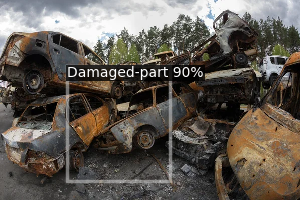

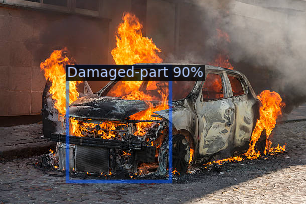

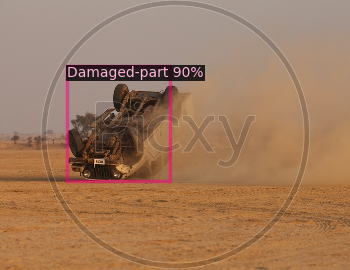

In [23]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/noisy_test/*jpg'):
  im = cv2.imread(imageName)
  outputs = ensemble_predictions(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.5
                 )
  out = v.draw_instance_predictions(ensemble_output)
  cv2_imshow(out.get_image()[:, :, ::-1])